# Logistic Regression

In [1]:
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport

from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge, RidgeCV, Lasso, LassoCV, ElasticNet, ElasticNetCV, LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score

import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

import matplotlib.pyplot as plt
import seaborn as sns
import pickle

In [6]:
df= pd.read_csv(r"D:/ML by Sudh/diabetes.csv")
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


In [7]:
pf= ProfileReport(df)
pf.to_widgets()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
df['BMI']= df['BMI'].replace(0, df['BMI'].mean())

In [9]:
df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [10]:
df['BloodPressure']= df['BloodPressure'].replace(0, df['BloodPressure'].mean())

In [11]:
df['Insulin']= df['Insulin'].replace(0, df['Insulin'].mean())

In [12]:
df['Glucose']= df['Glucose'].replace(0, df['Glucose'].mean())

In [13]:
df['SkinThickness']= df['SkinThickness'].replace(0, df['SkinThickness'].mean())

<AxesSubplot:>

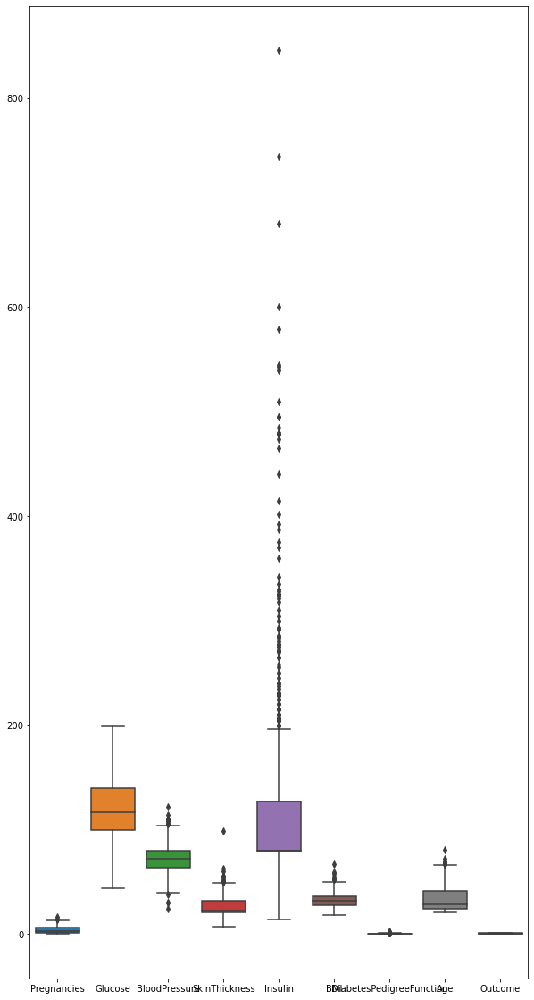

In [16]:
fig, ax= plt.subplots(figsize= (10, 20))

sns.boxplot(data=df, ax=ax)

In [20]:
q= df['Insulin'].quantile(0.95)
df_new= df[df['Insulin']<q]

df_new

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


<AxesSubplot:>

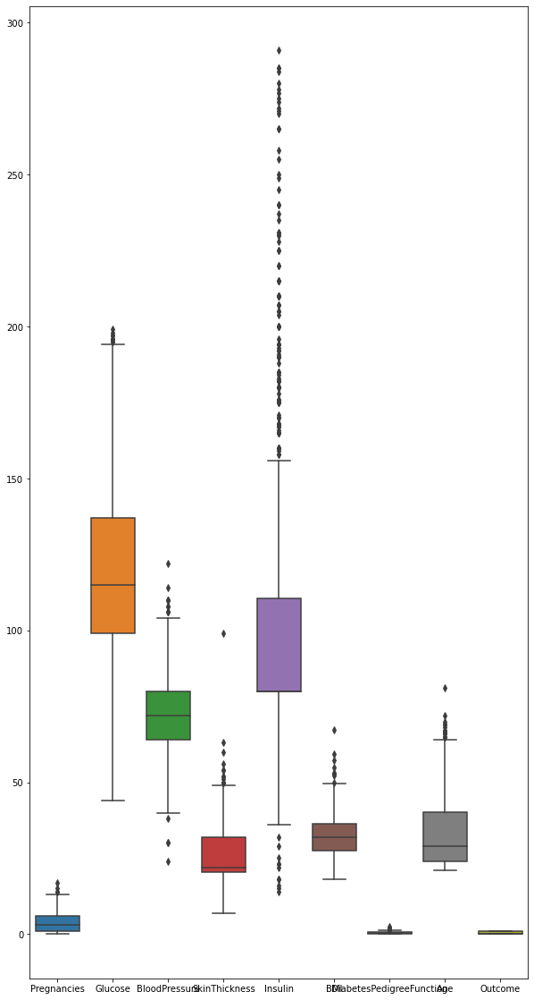

In [21]:
fig, ax= plt.subplots(figsize= (10, 20))

sns.boxplot(data=df_new, ax=ax)

<AxesSubplot:>

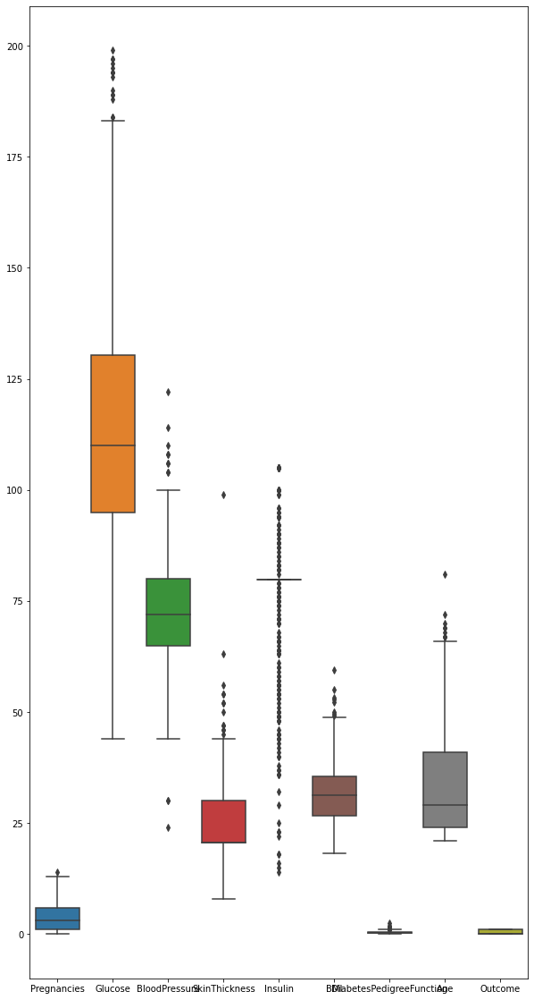

In [22]:
q= df['Insulin'].quantile(0.70)
df_new= df[df['Insulin']<q]

fig, ax= plt.subplots(figsize= (10, 20))

sns.boxplot(data=df_new, ax=ax)

<AxesSubplot:>

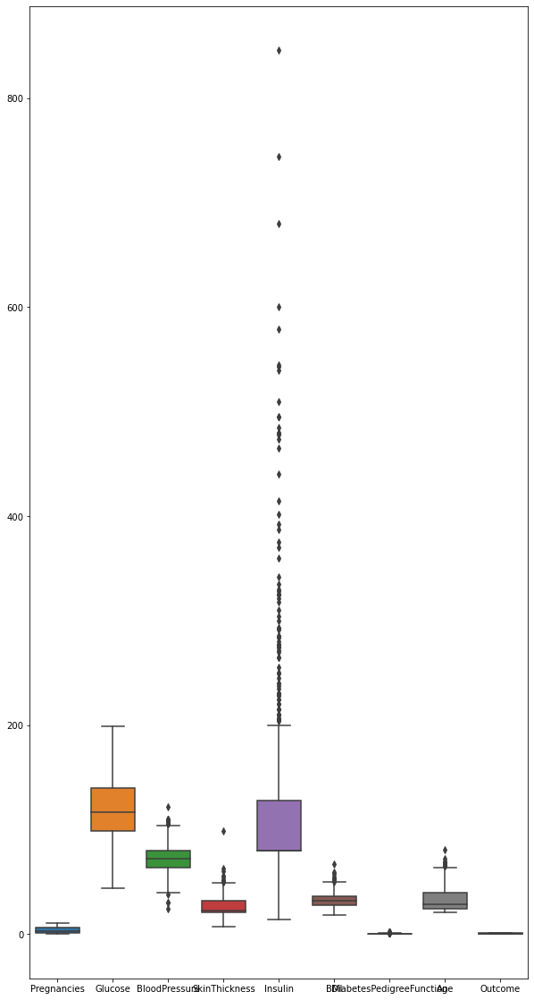

In [23]:
q= df['Pregnancies'].quantile(0.98)
df_new= df[df['Pregnancies']<q]

fig, ax= plt.subplots(figsize= (10, 20))

sns.boxplot(data=df_new, ax=ax)

<AxesSubplot:>

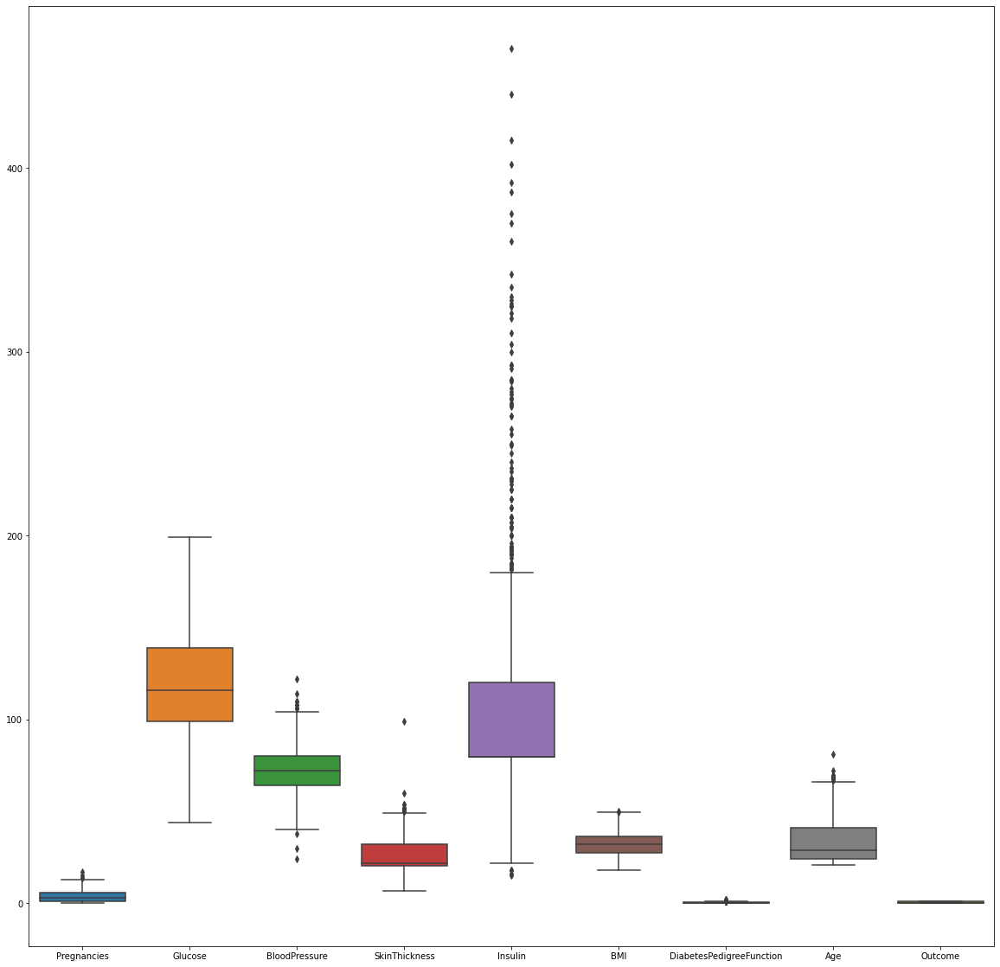

In [24]:
q= df['Insulin'].quantile(0.98)
df_new= df[df['Insulin']<q]

q= df['BMI'].quantile(0.99)
df_new= df_new[df_new['BMI']<q]

fig, ax= plt.subplots(figsize= (20, 20))

sns.boxplot(data=df_new, ax=ax)

<AxesSubplot:>

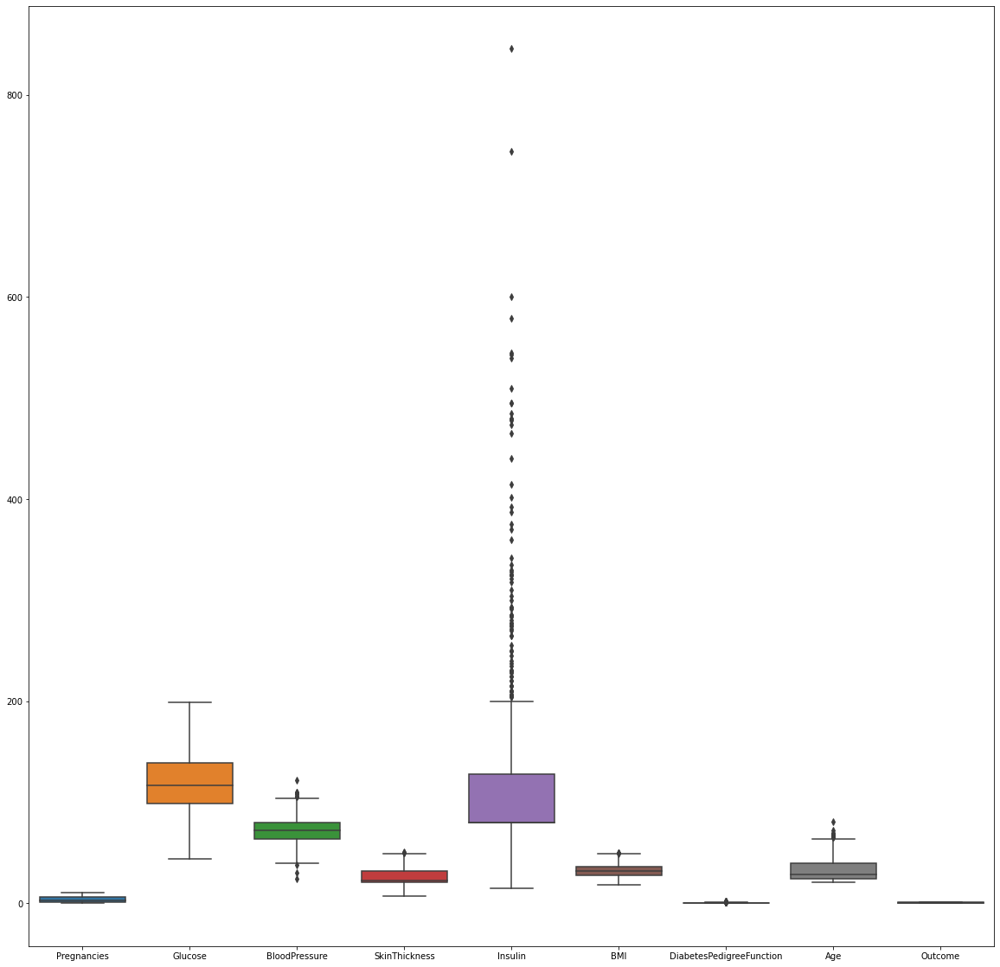

In [25]:
q= df['Pregnancies'].quantile(0.98)
df_new= df[df['Pregnancies']<q]

q= df['BMI'].quantile(0.99)
df_new= df_new[df_new['BMI']<q]

q= df['SkinThickness'].quantile(0.99)
df_new= df_new[df_new['SkinThickness']<q]

fig, ax= plt.subplots(figsize= (20, 20))

sns.boxplot(data=df_new, ax=ax)

<AxesSubplot:>

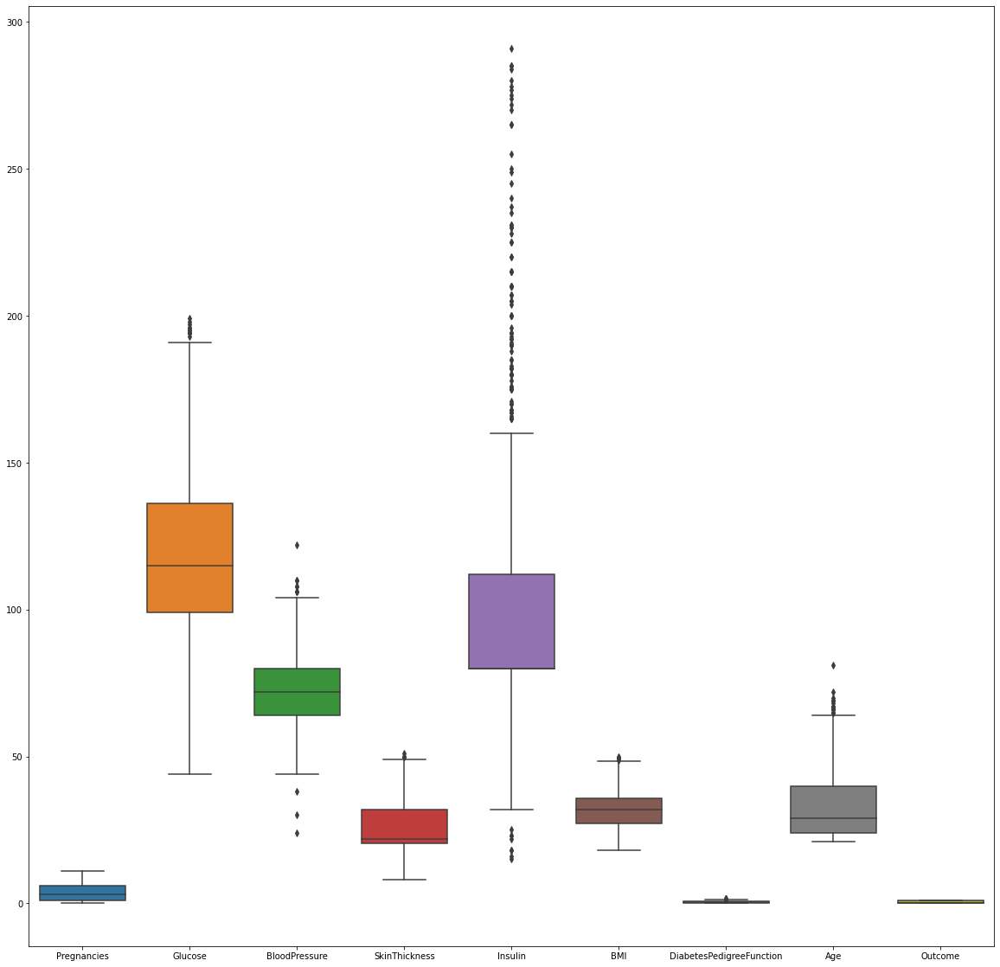

In [27]:
q= df['Pregnancies'].quantile(0.98)
df_new= df[df['Pregnancies']<q]

q= df['BMI'].quantile(0.99)
df_new= df_new[df_new['BMI']<q]

q= df['SkinThickness'].quantile(0.99)
df_new= df_new[df_new['SkinThickness']<q]

q= df['Insulin'].quantile(0.95)
df_new= df_new[df_new['Insulin']<q]

q= df['DiabetesPedigreeFunction'].quantile(0.99)
df_new= df_new[df_new['DiabetesPedigreeFunction']<q]

fig, ax= plt.subplots(figsize= (20, 20))

sns.boxplot(data=df_new, ax=ax)

In [28]:
ProfileReport(df_new)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [29]:
q= df['Pregnancies'].quantile(0.98)
df_new= df[df['Pregnancies']<q]

q= df['BMI'].quantile(0.99)
df_new= df_new[df_new['BMI']<q]

q= df['SkinThickness'].quantile(0.99)
df_new= df_new[df_new['SkinThickness']<q]

q= df['Insulin'].quantile(0.95)
df_new= df_new[df_new['Insulin']<q]

q= df['DiabetesPedigreeFunction'].quantile(0.99)
df_new= df_new[df_new['DiabetesPedigreeFunction']<q]

q= df['Age'].quantile(0.99)
df_new= df_new[df_new['Age']<q]

df_new.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
5,5,116.0,74.0,20.536458,79.799479,25.6,0.201,30,0


In [ ]:
def outlier_removal(self, data):
    def outlier_limits(col):
        Q3, Q1= np.nanpercentile(col, [75, 25])
        IQR= Q3-Q1
        UL= Q3+1.5*IQR
        LL= Q1-1.5*IQR
        return UL, LL
    
    for columns in data.columns:
        if data[columns].dtype != 'int64':
            UL, LL= outlier_limits(data[columns])
            data[columns]= np.where((data[columns]>UL) | (data[columns]<LL),
                                   np.nan, data[columns])
    return data

In [30]:
y= df_new['Outcome']
y

0      1
1      0
2      1
3      0
5      0
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 680, dtype: int64

In [31]:
X= df_new.drop(columns=['Outcome'])
X

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21
5,5,116.0,74.0,20.536458,79.799479,25.6,0.201,30
...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47


In [37]:
scalar = StandardScaler()
X_scaled = scalar.fit_transform(X)

In [38]:
def vif_score(x):
    scaler = StandardScaler()
    arr = scaler.fit_transform(x)
    return pd.DataFrame([[x.columns[i], variance_inflation_factor(arr,i)] for i in range(arr.shape[1])], columns=["FEATURE", "VIF_SCORE"])


In [39]:
vif_score(X)

,FEATURE,VIF_SCORE
0,Pregnancies,1.452236
1,Glucose,1.306339
2,BloodPressure,1.263154
3,SkinThickness,1.484098
4,Insulin,1.282659
5,BMI,1.525553
6,DiabetesPedigreeFunction,1.040328
7,Age,1.666414


In [40]:
x_train, x_test, y_train, y_test = train_test_split(X_scaled, y , test_size= 0.20 , random_state= 144)

In [41]:
x_train

array([[-0.19442966, -0.27854254, -1.35040476, ..., -0.28624028,
         0.3666653 , -0.21887404],
       [ 0.13859848,  0.91971237,  1.09307712, ..., -0.47354249,
        -0.89655939, -0.49330738],
       [ 1.80373918, -1.61374088,  0.50327115, ..., -0.05211252,
        -0.58418589,  0.51294819],
       ...,
       [ 1.80373918,  2.22067485,  1.09307712, ..., -0.3018488 ,
         2.61850062,  1.51920376],
       [ 2.13676732, -1.51103331,  0.84030313, ...,  0.21323227,
        -0.64254138,  0.51294819],
       [ 0.80465476, -0.58666524,  1.5143671 , ...,  0.58783668,
         0.76828837, -0.4018296 ]])

In [42]:
x_test

array([[ 0.47162662,  0.57735382,  1.00881912, ...,  0.47857706,
        -0.56358984,  0.23851486],
       [-0.86048595,  0.3719387 , -1.01337277, ..., -0.52036804,
         0.83007653, -1.04217405],
       [ 2.46979547,  0.81700481,  1.85139908, ...,  0.72831334,
        -0.67343546,  1.70215932],
       ...,
       [-0.52745781, -1.20291062, -0.24616423, ...,  0.0091631 ,
        -0.50180167, -1.04217405],
       [-0.86048595, -1.64797673, -2.02446872, ..., -1.80026645,
        -0.43658083, -0.95069627],
       [-0.86048595, -0.99749549, -0.84485678, ..., -0.73888728,
         0.44561685, -0.76774071]])

In [43]:
x_test[0]

array([ 0.47162662,  0.57735382,  1.00881912,  1.74646698, -0.27366809,
        0.47857706, -0.56358984,  0.23851486])

In [45]:
from sklearn.linear_model import LogisticRegression

In [46]:
logr_liblinear = LogisticRegression(verbose=1, solver='liblinear')

In [49]:
logr= logr_liblinear.fit(x_train, y_train )

[LibLinear]

In [50]:
logr.predict_proba([x_test[1]])

array([[0.70315489, 0.29684511]])

In [51]:
logr.predict([x_test[1]])

array([0], dtype=int64)

In [52]:
logr.predict_log_proba([x_test[1]])

array([[-0.35217809, -1.21454478]])

In [53]:
type(y_test)

pandas.core.series.Series

In [54]:
y_test.iloc[1]

0

In [55]:
y_test

402    1
507    0
24     1
751    0
444    1
      ..
448    1
564    0
60     0
97     0
353    0
Name: Outcome, Length: 136, dtype: int64

In [56]:
logr = LogisticRegression(verbose=1)

In [57]:
logr.fit(x_train,y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.9s finished


LogisticRegression(verbose=1)

In [58]:
y_pred_liblinear = logr_liblinear.predict(x_test)
y_pred_liblinear

array([0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1,
       1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0], dtype=int64)

In [59]:
y_pred_default = logr.predict(x_test)
y_pred_default

array([0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1,
       1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0], dtype=int64)

In [60]:
confusion_matrix(y_test, y_pred_liblinear)

array([[84, 10],
       [23, 19]], dtype=int64)

In [61]:
def model_eval(y_true,y_pred):
    tn, fp, fn, tp = confusion_matrix(y_test,y_pred).ravel()
    accuracy= (tp+tn)/(tp+tn+fp+fn)
    precision= tp/(tp+fp)
    recall= tp/(tp+fn)
    specificity= tn/(fp+tn)
    F1_Score = 2*(recall * precision) / (recall + precision)
    result= {"Accuracy":accuracy,"Precision":precision,"Recall":recall,'Specficity':specificity,'F1':F1_Score}
    return result

model_eval(y_test, y_pred_liblinear)

{'Accuracy': 0.7573529411764706,
 'Precision': 0.6551724137931034,
 'Recall': 0.4523809523809524,
 'Specficity': 0.8936170212765957,
 'F1': 0.5352112676056338}

In [62]:
model_eval(y_test, y_pred_default)

{'Accuracy': 0.7573529411764706,
 'Precision': 0.6551724137931034,
 'Recall': 0.4523809523809524,
 'Specficity': 0.8936170212765957,
 'F1': 0.5352112676056338}

In [63]:
auc = roc_auc_score(y_test, y_pred_liblinear)

In [64]:
roc_auc_score(y_test, y_pred_default)

0.672998986828774

In [65]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_liblinear)

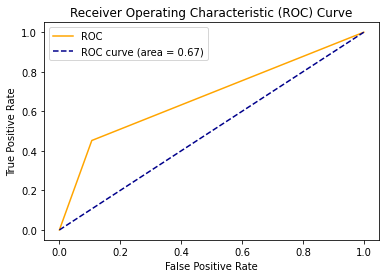

In [66]:
plt.plot(fpr, tpr, color='orange', label='ROC')
plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--',label='ROC curve (area = %0.2f)' % auc)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()